In [65]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)  # Adjusts the configuration of the plots we will create

# Read in data
df = pd.read_csv('/Users/anthonylaite/Desktop/projects/WorldExpenditures.csv')

# Drop the unnamed column
df = df.loc[:, ~df.columns.str.contains('^Unnamed')] 

# Display the entire DataFrame
df





,Year,Country,Sector,Expenditure(million USD),GDP(%)
0,2000,Australia,Total function,153122.633,37.36193
1,2000,Australia,"Agriculture, forestry, fishing and hunting",2195.583,0.53572
2,2000,Australia,"Mining, manufacturing and construction",905.018,0.22082
3,2000,Australia,Transport,11417.379,2.78584
4,2000,Australia,Fuel and energy,2251.241,0.54930
...,...,...,...,...,...
25728,2021,United States of America,Social protection,2827585.060,12.07255
25729,2021,United States of America,General public services,1291640.230,5.51474
25730,2021,United States of America,Defence,759321.990,3.24197
25731,2021,United States of America,Public order and safety,459973.190,1.96388


In [188]:
# Assuming df_numerized is your DataFrame
df_no_short = df_numerized.drop(columns=['sectorshort'])

# Check for missing data in each column
for col in df_no_short.columns:
    pct_missing = np.mean(df_no_short[col].isnull())
    print(f'{col} - {pct_missing * 100:.2f}%')



Year - 0.00%
Country - 0.00%
Sector - 0.00%
Expenditure(million USD) - 2.18%
GDP(%) - 2.18%


In [80]:
# Display data types for columns
print(df.dtypes)


Year                          int64
Country                      object
Sector                       object
Expenditure(million USD)    float64
GDP(%)                      float64
sectorshort                  object
dtype: object


In [104]:
# Change data types of columns
df['Expenditure(million USD)'] = df['Expenditure(million USD)'].astype('float64')
df['Year'] = df['Year'].astype('int64')






In [189]:
# Assuming df is your DataFrame
df_no_short = df.drop(columns=['sectorshort'])

# Sort the DataFrame by 'Expenditure(million USD)' column
sorted_df = df_no_short.sort_values(by=['Expenditure(million USD)'], ascending=False)

# Display the sorted DataFrame
sorted_df

,Year,Country,Sector,Expenditure(million USD),GDP(%)
25723,2021,United States of America,Total function,10476081.77,44.72828
24618,2020,United States of America,Total function,9964037.77,47.08125
23294,2019,United States of America,Total function,8221633.68,38.26489
21952,2018,United States of America,Total function,7794634.64,37.77565
20587,2017,United States of America,Total function,7412758.17,37.85731
...,...,...,...,...,...
25501,2021,Serbia and Montenegro,"General economic, commercial and labour affairs",NaN,NaN
25502,2021,Serbia and Montenegro,Other industries,NaN,NaN
25503,2021,Serbia and Montenegro,RandD Economic affairs,NaN,NaN
25504,2021,Serbia and Montenegro,Economic affairs n.e.c.,NaN,NaN


In [114]:
#drop any duplicate 

df['Country'].drop_duplicates().sort_values(ascending=False)

2697                                Yemen
12565                             Vanuatu
15127                          Uzbekistan
775              United States of America
756                        United Kingdom
1641                              Ukraine
9000                              Türkiye
13774                              Tuvalu
736                           Timor-Leste
735                              Thailand
716            Switzerland, Liechtenstein
706                                Sweden
696                             Sri Lanka
677                                 Spain
663                          South Africa
20408                             Somalia
644                              Slovenia
634                              Slovakia
620                             Singapore
607                            Seychelles
7751                Serbia and Montenegro
587                                Serbia
2470                           San Marino
11108                             

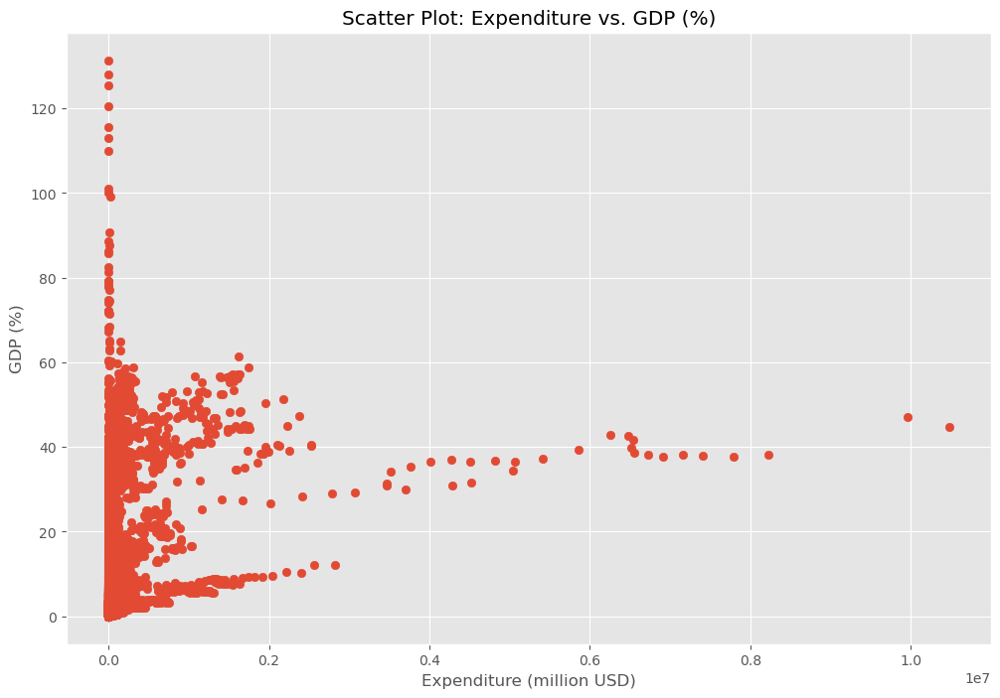

In [118]:
import matplotlib.pyplot as plt

# Scatter plot to visualize the relationship between Expenditure and GDP (%)
plt.scatter(x=df['Expenditure(million USD)'], y=df['GDP(%)'])
plt.title('Scatter Plot: Expenditure vs. GDP (%)')
plt.xlabel('Expenditure (million USD)')
plt.ylabel('GDP (%)')
plt.show()

In [119]:
df.head()
df

,Year,Country,Sector,Expenditure(million USD),GDP(%),sectorshort
0,2000,Australia,Total function,1.531226e+05,37.36193,Tota
1,2000,Australia,"Agriculture, forestry, fishing and hunting",2.195583e+03,0.53572,Agri
2,2000,Australia,"Mining, manufacturing and construction",9.050180e+02,0.22082,Mini
3,2000,Australia,Transport,1.141738e+04,2.78584,Tran
4,2000,Australia,Fuel and energy,2.251241e+03,0.54930,Fuel
5,2000,Australia,Environment protection,2.051800e+03,0.50064,Envi
6,2000,Australia,Housing and community amenities,2.529530e+03,0.61721,Hous
7,2000,Australia,Health,2.407198e+04,5.87357,Heal
8,2000,Australia,Education,2.306667e+04,5.62827,Educ
9,2000,Australia,Social protection,4.360670e+04,10.64004,Soci


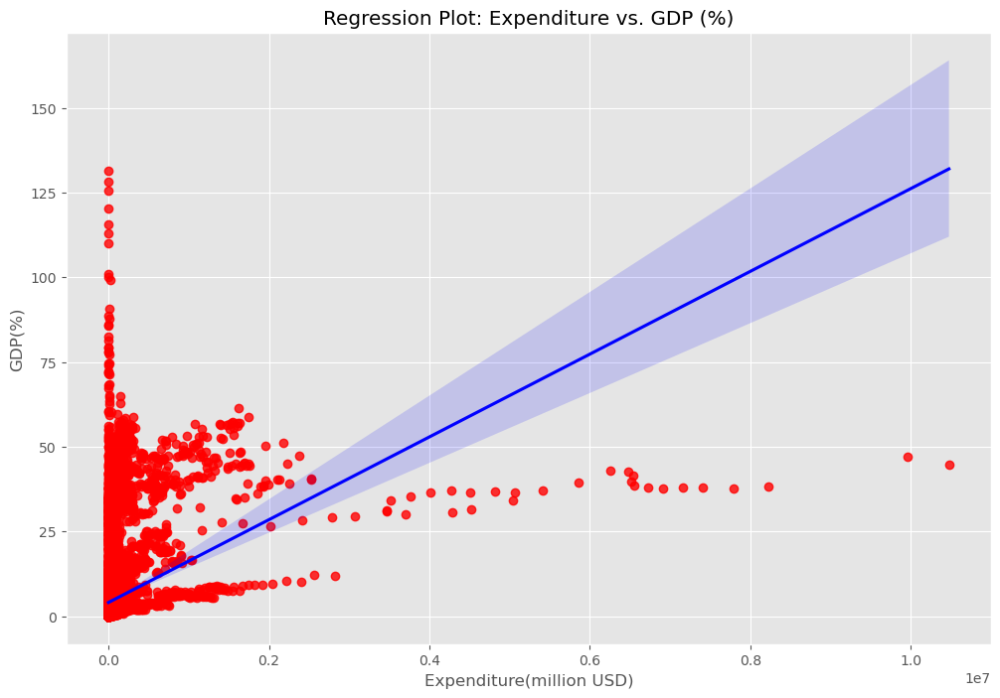

In [128]:
#plot budget vs groos using seaborn 

import seaborn as sns
import matplotlib.pyplot as plt


sns.regplot(x='Expenditure(million USD)', y='GDP(%)', data=df, scatter_kws={'color': 'red'}, line_kws={'color': 'blue'})
plt.title('Regression Plot: Expenditure vs. GDP (%)')
plt.show()



In [134]:
import pandas as pd

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix_pearson = df[numeric_columns].corr()

print(correlation_matrix_pearson)




                              Year  Expenditure(million USD)    GDP(%)
Year                      1.000000                  0.029711 -0.000590
Expenditure(million USD)  0.029711                  1.000000  0.307794
GDP(%)                   -0.000590                  0.307794  1.000000


                              Year  Expenditure(million USD)    GDP(%)
Year                      1.000000                  0.029711 -0.000590
Expenditure(million USD)  0.029711                  1.000000  0.307794
GDP(%)                   -0.000590                  0.307794  1.000000


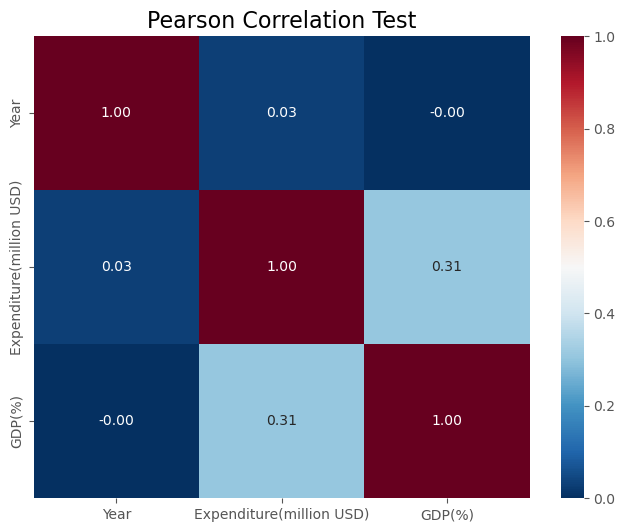

In [139]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix_pearson = df[numeric_columns].corr()

# Display the correlation matrix
print(correlation_matrix_pearson)

# Create a heatmap with a custom color map and title
plt.figure(figsize=(8, 6))  # Adjust the figure size if needed
sns.heatmap(correlation_matrix_pearson, annot=True, cmap="RdBu_r", fmt=".2f")
plt.title("Pearson Correlation Test", fontsize=16)  # Add the title

plt.show()




In [141]:
df_numerized = df 

For col_name in df_numerized.columns 
if(df)numerized[col_name].dtype == 'object'): 
    df_numerized[col_name] = df_numerized[col_name].astype('category')
    df_numerized[col_name = df_numerized[col_name].cat.codes 
    
    df_numerized

SyntaxError: unmatched ')' (2178749083.py, line 4)

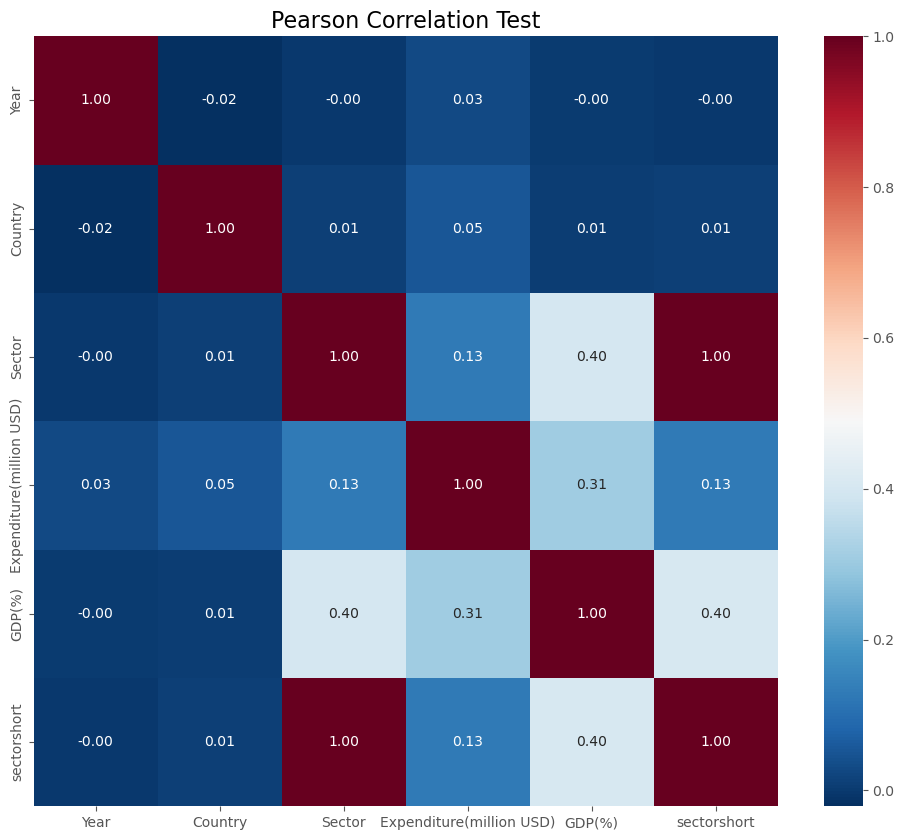

In [164]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_numerized is your DataFrame
correlation_matrix_pearson = df_numerized.corr()

# Create a heatmap with a custom color map and title
plt.figure(figsize=(12, 10))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix_pearson, annot=True, cmap="RdBu_r", fmt=".2f")
plt.title("Pearson Correlation Test", fontsize=16)  # Add the title

plt.show()



In [193]:
correlation_mat = df_numerized.drop(columns=['sectorshort']).corr()

corr_pairs = correlation_mat.unstack()

corr_pairs



Year                      Year                        1.000000
                          Country                    -0.021175
                          Sector                     -0.002339
                          Expenditure(million USD)    0.029711
                          GDP(%)                     -0.000590
Country                   Year                       -0.021175
                          Country                     1.000000
                          Sector                      0.009301
                          Expenditure(million USD)    0.052828
                          GDP(%)                      0.005818
Sector                    Year                       -0.002339
                          Country                     0.009301
                          Sector                      1.000000
                          Expenditure(million USD)    0.126487
                          GDP(%)                      0.401555
Expenditure(million USD)  Year                        0

In [194]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs


Year                      Country                    -0.021175
Country                   Year                       -0.021175
Sector                    Year                       -0.002339
Year                      Sector                     -0.002339
GDP(%)                    Year                       -0.000590
Year                      GDP(%)                     -0.000590
Country                   GDP(%)                      0.005818
GDP(%)                    Country                     0.005818
Country                   Sector                      0.009301
Sector                    Country                     0.009301
Year                      Expenditure(million USD)    0.029711
Expenditure(million USD)  Year                        0.029711
Country                   Expenditure(million USD)    0.052828
Expenditure(million USD)  Country                     0.052828
Sector                    Expenditure(million USD)    0.126487
Expenditure(million USD)  Sector                      0

In [195]:
filtered_corr = sorted_pairs[(sorted_pairs > 0.29) & (sorted_pairs < 1.0) & (sorted_pairs.index.get_level_values(0) != 'sectorshort') & (sorted_pairs.index.get_level_values(1) != 'sectorshort')].drop_duplicates()
filtered_corr




Expenditure(million USD)  GDP(%)    0.307794
GDP(%)                    Sector    0.401555
dtype: float64